In [8]:
import xarray as xr
import matplotlib.pyplot as plt
from cmocean import cm 
import numpy as np
import pandas as pd
from tqdm import tqdm

In [9]:
ds = xr.open_dataset(r'../data/amazon2.nc')

The W in the middle of every layer without cummulative
$$
w_{k+\frac{1}{2}} = -\left( \nabla_h \cdot \vec{u} \right)_k \cdot \Delta z_k
$$



In [10]:
A = 6371.0e3  # radio terrestre en metros

# Selecciona los campos de velocidad
u = ds.uo.isel(time=0)
v = ds.vo.isel(time=0)

# --------------------------
# 1. CÁLCULO DE DX, DY, DZ
# --------------------------

dy = np.deg2rad(ds.latitude.shift(latitude=-1) - ds.latitude) * A
dx = (
    np.deg2rad(ds.longitude.shift(longitude=-1) - ds.longitude)
    * A * np.cos(np.deg2rad(ds.latitude))
)

# z_mid y dz entre niveles
z_mid = (ds.depth.shift(depth=-1) + ds.depth) / 2
z_mid = z_mid.isel(depth=slice(0, -1))  # 49 niveles, sin NaN
dz = ds.depth.diff('depth')             # también 49 niveles

# --------------------------
# 2. INTERPOLACIÓN A CENTRO DE CELDA
# --------------------------

# dudx al centro horizontal
dudx = (u.shift(longitude=-1) - u) / dx
dudx = (dudx.shift(latitude=-1) + dudx) / 2.0

# dvdy al centro horizontal
dvdy = (v.shift(latitude=-1) - v) / dy
dvdy = (dvdy.shift(longitude=-1) + dvdy) / 2.0

# lat/lon en el centro
lon_c = (ds.longitude.shift(longitude=-1) + ds.longitude) / 2
lat_c = (ds.latitude.shift(latitude=-1) + ds.latitude) / 2

# Ajustar coordenadas y recortar bordes (porque hicimos shift)
dudx = dudx.assign_coords(longitude=lon_c, latitude=lat_c).isel(longitude=slice(None, -1), latitude=slice(None, -1))
dvdy = dvdy.assign_coords(longitude=lon_c, latitude=lat_c).isel(longitude=slice(None, -1), latitude=slice(None, -1))

# --------------------------
# 3. DIVERGENCIA HORIZONTAL
# --------------------------

div_h = dudx + dvdy
div_h = div_h.transpose("depth", "latitude", "longitude")  # asegurar orden

# --------------------------
# 4A. MÉTODO 1: PERFIL ACUMULADO DE W DESDE SUPERFICIE
# --------------------------

# Broadcast dz para que tenga shape compatible con div_h
dz_3d = dz.broadcast_like(div_h.isel(depth=slice(0, -1)))

# integrando desde superficie
integrand = -div_h.isel(depth=slice(0, -1)) * dz_3d
w_accum = integrand.cumsum("depth", skipna=True)
w_accum = w_accum.assign_coords(depth=z_mid)
w_accum.name = "w_accum"

# --------------------------
# 4B. MÉTODO 2: W LOCAL ENTRE PARES DE CAPAS (NO ACUMULADO)
# --------------------------

dw = -div_h.isel(depth=slice(0, -1)) * dz_3d


# Paso 4: integración acumulativa desde w_0 = 0
w_local = -div_h.isel(depth=slice(0, -1)) * dz_3d
w_local = w_local.assign_coords(depth=z_mid)
w_local.name = "w_local"
# --------------------------
# 5. OPCIONAL: GUARDAR O PLOT
# --------------------------

# w_local.isel(latitude=0, longitude=0).plot(y="depth")
# w_accum.isel(latitude=0, longitude=0).plot(y="depth")

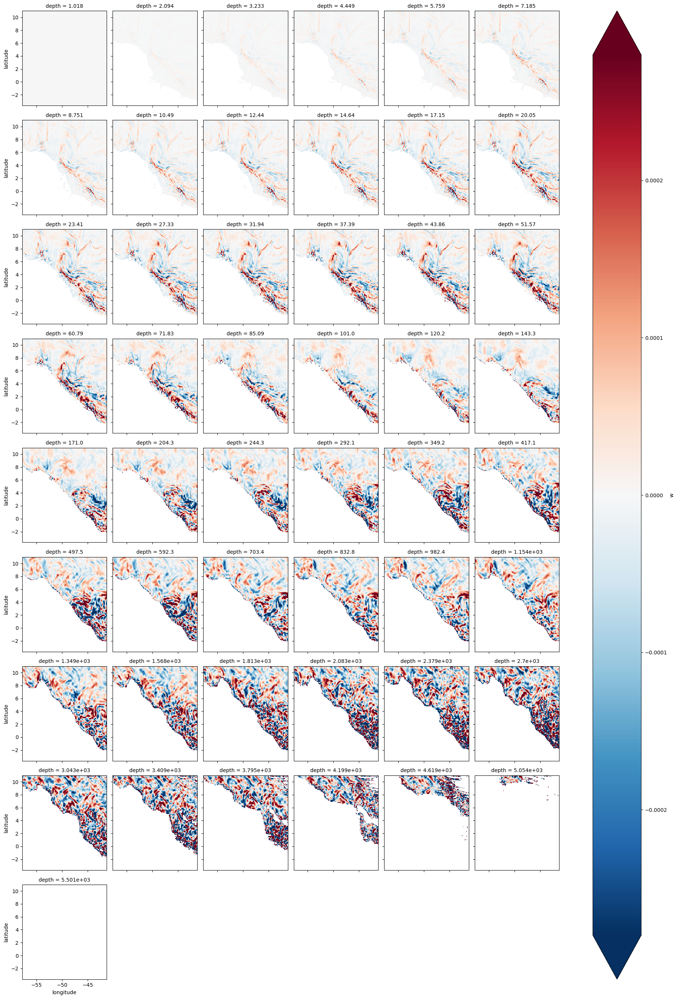

In [111]:
w.plot(x='longitude',y='latitude',col='depth',col_wrap=6, robust=True)


In [162]:
# Paso 1: Integrando verticalmente
integrand = -div_h.isel(depth=slice(0, -1)) * dz_3d  # (depth-1, lat, lon)

# Paso 2: Cumsum del numerador y denominador
numerator = integrand.cumsum(dim="depth", skipna=True)
denominator = dz_3d.cumsum(dim="depth", skipna=True)

# Paso 3: División segura
w_mean = (numerator / denominator).where((numerator != 0) & (denominator != 0))

# Paso 4: Ajustar coordenadas
w_mean = w_mean.assign_coords(depth=z_mid)
w_mean.name = "w_mean"


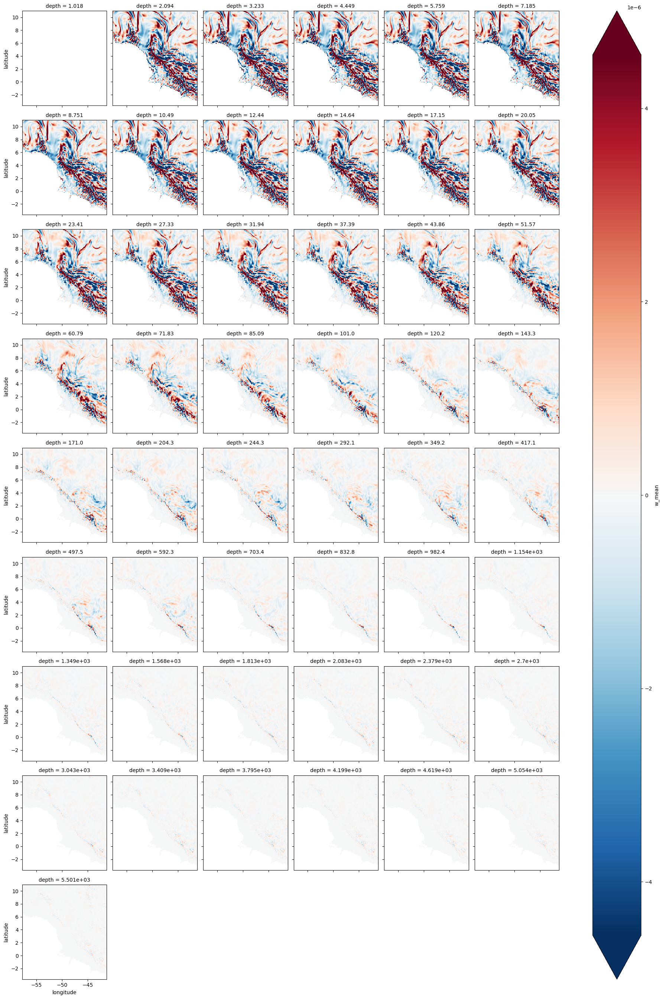

In [7]:
w_mean.plot(x='longitude',y='latitude',col='depth',col_wrap=6, robust=True)
# plt.savefig('Figures/w_mean.png',format='png', 
#             dpi=300, transparent=False,bbox_inches='tight')

In [167]:
w_mean

<xarray.DataArray 'w_mean' (depth: 49, latitude: 176, longitude: 198)>
array([[[           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
        [           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
        [           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
        ...,
        [           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
        [           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
        [           nan,            nan,            nan, ...,
                    nan,            nan,            nan]],

       [[           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
        [           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
        [           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
...
        [-6.2892070e-08, -9.4723752e-08, -5.6831036e-11, ...,
          1.6397683e-08, -5.0934499e-08, -2.7889362e-08],
        [ 1.4410008e-07, -1.4784743e-07, -8.1365696e-09, ...,
          9.6520649e-09, -6.6429592e-08, -2.2136371e-09],
        [ 1.4678672e-07, -1.4767291e-07, -3.5450153e-08, ...,
         -8.7984979e-08,  4.0505636e-08,  1.0801495e-09]],

       [[           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
        [           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
        [           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
        ...,
        [-5.7627584e-08, -8.6794749e-08, -5.2073901e-11, ...,
          1.5025089e-08, -4.6670944e-08, -2.5554836e-08],
        [ 1.3203795e-07, -1.3547162e-07, -7.4554851e-09, ...,
          8.8441228e-09, -6.0868992e-08, -2.0283411e-09],
        [ 1.3449969e-07, -1.3531171e-07, -3.2482742e-08, ...,
         -8.0620055e-08,  3.7115043e-08,  9.8973374e-10]]], dtype=float32)
Coordinates:
  * depth      (depth) float32 1.018 2.094 3.233 ... 5.054e+03 5.501e+03
  * latitude   (latitude) float32 -3.625 -3.542 -3.458 ... 10.79 10.88 10.96
  * longitude  (longitude) float32 -57.71 -57.62 -57.54 ... -41.46 -41.37 -41.29
    time       datetime64[ns] 2021-06-01
Attributes:
    units:      m/s
    long_name:  normalized accumulated Vertical velocity

In [166]:

w_mean.attrs["units"] = "m/s"
w_mean.attrs["long_name"] = "normalized accumulated Vertical velocity"

w_mean.to_netcdf("w_mean.nc")

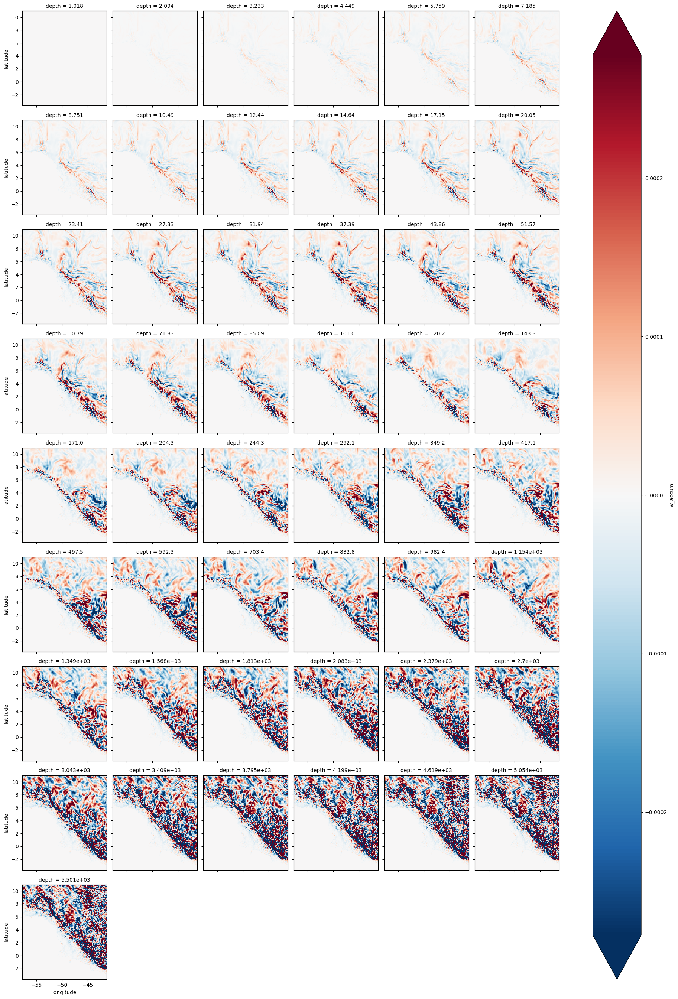

In [18]:
w_accum.plot(x='longitude',y='latitude',col='depth',col_wrap=6, robust=True)

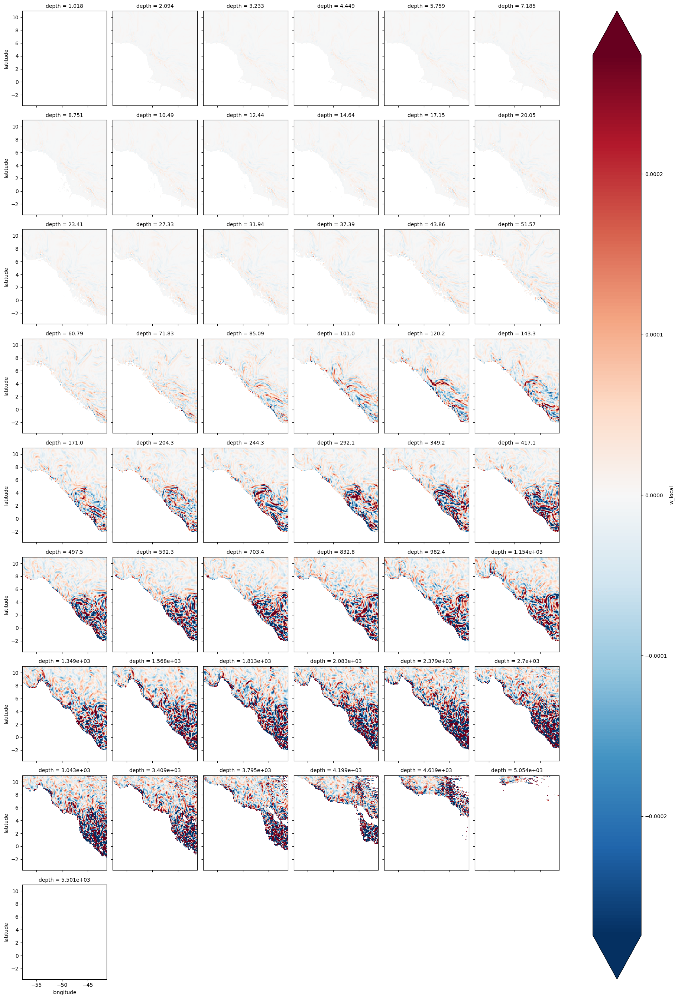

In [114]:
w_local.plot(x='longitude',y='latitude',col='depth',col_wrap=6, robust=True)

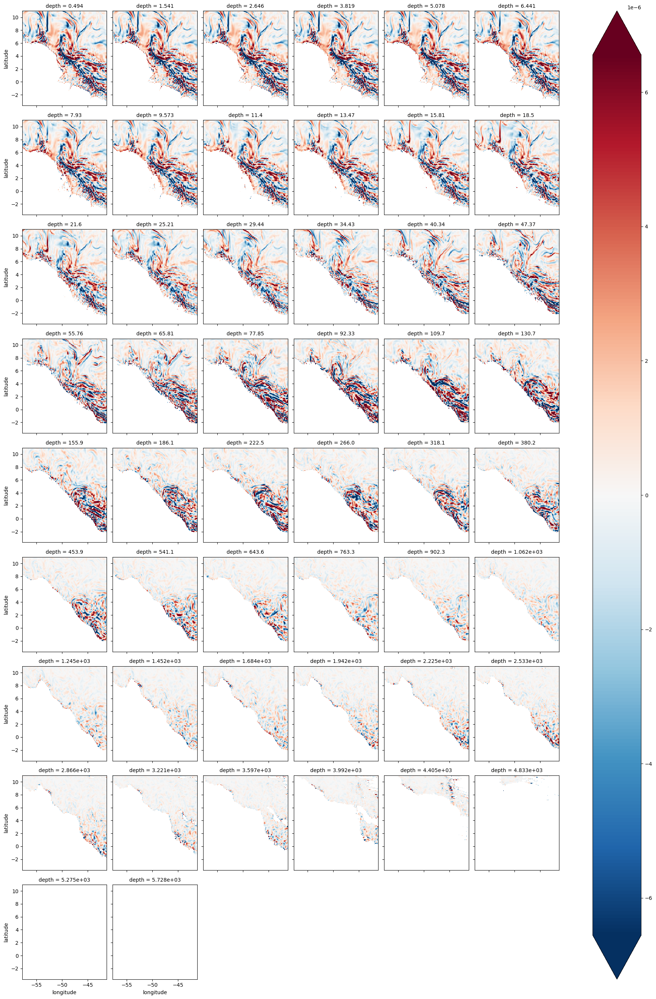

In [20]:
div_h.plot(x='longitude',y='latitude',col='depth',col_wrap=6, robust=True)

In [151]:
div_h_mid = (div_h.shift(depth=-1) + div_h) / 2
div_h_mid = div_h_mid.isel(depth=slice(0, -1))

# div_h_mid.plot(x='longitude',y='latitude',col='depth',col_wrap=6, robust=True)

In [152]:
dz_mid = z_mid.shift(depth=-1) - z_mid
# dz_mid = dz_mid.isel(depth=slice(0, -1))
dz_mid

<xarray.DataArray 'depth' (depth: 49)>
array([  1.0758221,   1.13906  ,   1.2162776,   1.3105597,   1.4256678,
         1.5661917,   1.7377195,   1.9470711,   2.2025356,   2.5142097,
         2.8943748,   3.3579254,   3.9229565,   4.61137  ,   5.4496574,
         6.4697723,   7.710121 ,   9.216785 ,  11.044781 ,  13.259407 ,
        15.937721 ,  19.16996  ,  23.0607   ,  27.729797 ,  33.312256 ,
        39.95735  ,  47.82611  ,  57.086365 ,  67.90515  ,  80.43793  ,
        94.814575 , 111.12207  , 129.38623  , 149.55347  , 171.47583  ,
       194.90552  , 219.49658  , 244.82092  , 270.39685  , 295.72168  ,
       320.3125   , 343.74194  , 365.66455  , 385.8318   , 404.0962   ,
       420.4038   , 434.7798   , 447.313    ,         nan], dtype=float32)
Coordinates:
  * depth    (depth) float32 0.494 1.541 2.646 ... 4.405e+03 4.833e+03 5.275e+03

In [153]:
# div_h_mid = div_h_mid.assign_coords(depth=z_mid)
div_h_mid
# div_h_mid.plot(x='longitude',y='latitude',col='depth',col_wrap=6, robust=True)

<xarray.DataArray (depth: 49, latitude: 176, longitude: 198)>
array([[[            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        ...,
        [-2.48376932e-06, -1.89776983e-06, -8.31487057e-07, ...,
         -3.52043514e-07, -4.86140493e-07, -3.50861654e-07],
        [-1.65395363e-06, -1.95759480e-06, -1.80010147e-06, ...,
          4.67098289e-08, -4.67084874e-07, -7.45859552e-07],
        [-4.48298664e-07, -9.45981014e-07, -1.32896912e-06, ...,
          3.64138430e-07, -1.73623285e-08, -5.30010539e-07]],

       [[            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
...
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan]],

       [[            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        ...,
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan]]],
      dtype=float32)
Coordinates:
    time       datetime64[ns] 2021-06-01
  * depth      (depth) float32 0.494 1.541 2.646 ... 4.833e+03 5.275e+03
  * latitude   (latitude) float32 -3.625 -3.542 -3.458 ... 10.79 10.88 10.96
  * longitude  (longitude) float32 -57.71 -57.62 -57.54 ... -41.46 -41.37 -41.29

In [154]:
dz_3d_mid = dz_mid.broadcast_like(div_h_mid.isel(depth=slice(0, -1)))
dz_3d_mid.shape

(49, 176, 198)

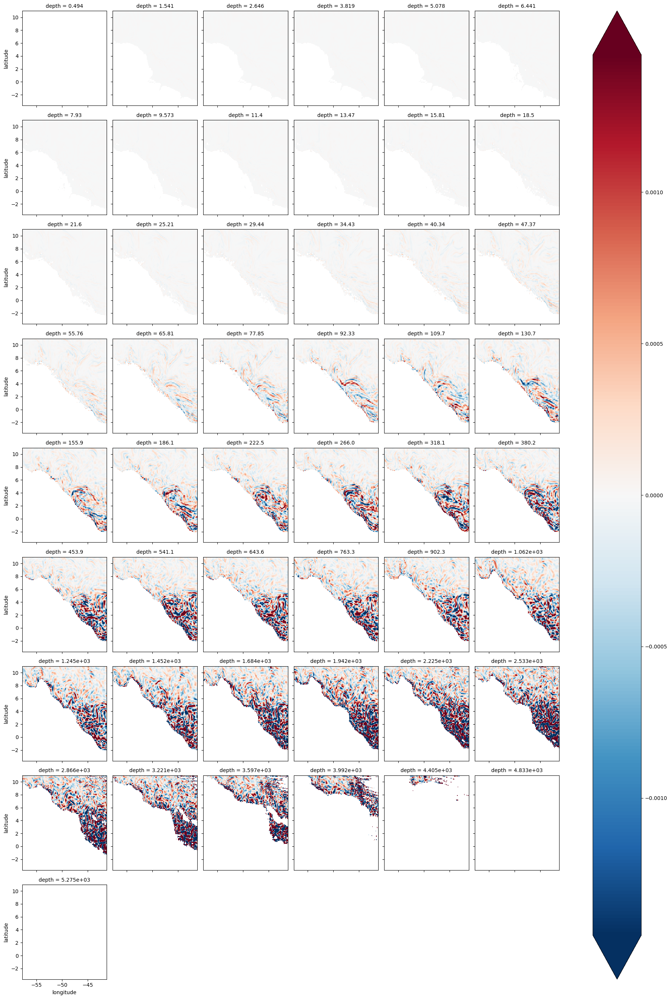

In [157]:
d = div_h_mid * z_mid  # or dz_3d_mid if dz_mid = z_k - z_{k-1}, depending on context
dw = -(d - d.shift(depth=1))
dw.plot(x='longitude',y='latitude',col='depth',col_wrap=6, robust=True)

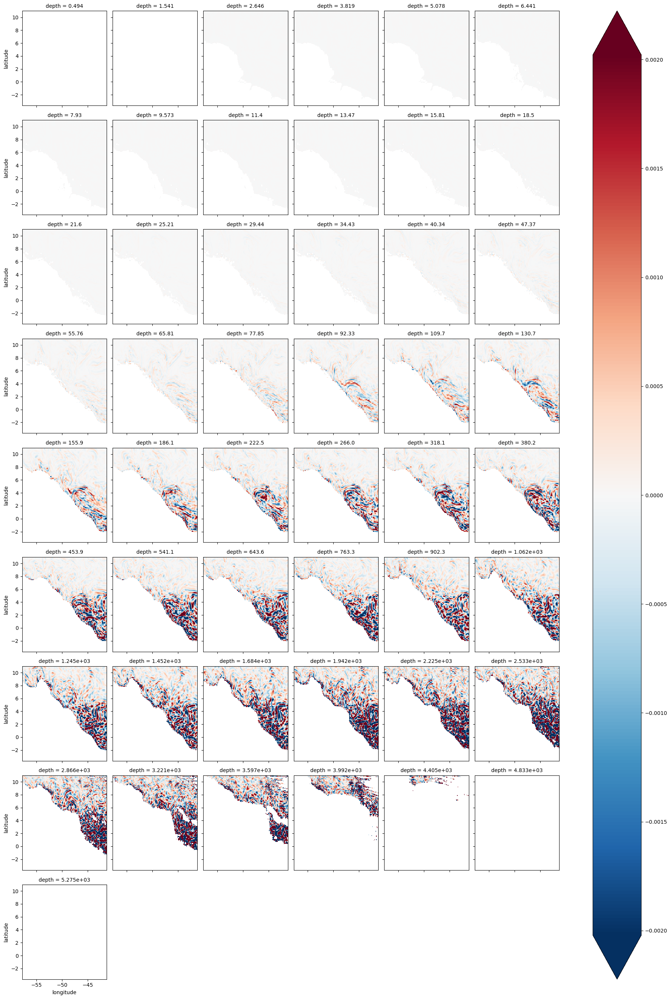

In [158]:
w = dw - dw.shift(depth=1)
w.plot(x='longitude',y='latitude',col='depth',col_wrap=6, robust=True)

### More Trials

In [33]:
print(div_h[:,100,100])
print(ds.depth)

<xarray.DataArray (depth: 50)>
array([ 3.2747016e-07,  3.6051449e-07,  3.2769299e-07,  2.6193186e-07,
        1.9605562e-07,  6.4431134e-08, -6.7429767e-08, -2.9842025e-07,
       -6.2810119e-07, -8.5831880e-07, -1.1212445e-06, -1.3843947e-06,
       -1.5160177e-06, -1.4832937e-06, -1.4837274e-06, -1.8140574e-06,
       -2.6060270e-06, -3.0023180e-06, -2.7400447e-06, -2.2118181e-06,
        6.6295831e-07,  5.6212807e-06,  7.7636469e-07, -8.8890266e-07,
        2.9940757e-06, -7.9403202e-07,  1.2301052e-07,  1.6403681e-06,
        9.5069436e-07, -7.3031777e-07, -1.1603604e-06, -1.3932297e-06,
       -1.0521478e-07,  1.2198045e-06,  9.7035979e-08,  4.6351721e-07,
       -5.9152353e-07,  1.2550834e-06,  3.3563570e-06, -5.0870540e-06,
                  nan,            nan,            nan,            nan,
                  nan,            nan,            nan,            nan,
                  nan,            nan], dtype=float32)
Coordinates:
    time       datetime64[ns] 2021-06-01
  * dept

In [81]:
div = div_h[:,120,120].data
z = ds.depth.data

w0 = 0

wk = -(div[1]*z[1] - div[0]*z[0]) + w0
wk

-9.94114316199557e-07

In [76]:
wf = -(div[1+1]*z[1+1] - div[0+1]*z[0+1]) + wk
wf

-2.129413360307808e-06

In [77]:
wd = -(div[1+2]*z[1+2]-div[0+2]*z[0+2]) + wf
wd

-3.2830130294314586e-06

In [ ]:
# for k in range(len(z)):
#     wk = -(div[1]-div[0]) + w

In [93]:
w = div.copy()
w[:] = np.nan  # iniciar vacío
w[0] = 0        # condición: w(z_0) = 0

for k in range(1, len(z)):
    w[k] = w[k - 1] + -(div[k]*z[k]-div[k-1]*z[k-1])

In [94]:
w

array([ 0.0000000e+00, -9.9411432e-07, -2.1294134e-06, -3.2830130e-06,
       -4.6877872e-06, -6.2833492e-06, -8.3699160e-06, -9.8865157e-06,
       -1.1868246e-05, -1.4545224e-05, -1.7157377e-05, -1.8316325e-05,
       -1.9316340e-05, -1.5106127e-05,  8.0098289e-07,  2.8174805e-05,
        3.9432969e-05,  5.1100469e-06, -2.7607522e-05, -3.6888821e-05,
        5.1880859e-05,  2.9025140e-04, -1.6272190e-04, -2.0593725e-05,
        1.6699916e-05,  2.0428604e-05, -5.0275466e-06,  1.3506436e-04,
        5.5529119e-05, -7.3651798e-05, -2.8219016e-04, -1.7572893e-04,
       -2.0205916e-05, -4.8363424e-04, -4.7282956e-06, -1.1977603e-03,
        9.8760717e-04, -3.0140637e-04, -1.0804796e-03,  8.2944194e-04,
        1.9135649e-03,  7.5663615e-04,  2.9504960e-03, -1.9842782e-04,
       -1.7809618e-03,            nan,            nan,            nan,
                  nan,            nan], dtype=float32)

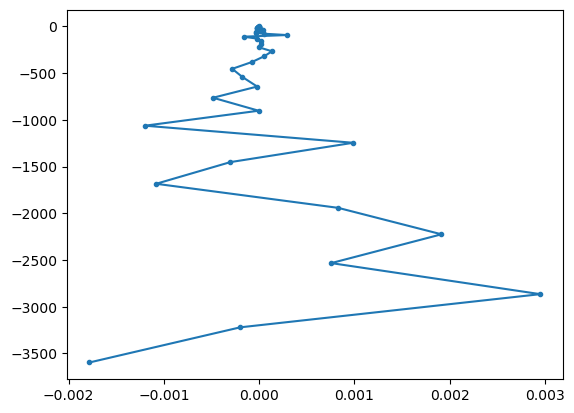

In [95]:
plt.plot(w,-z,marker='.')